In [ ]:
# use the "-q" flag to hide the output when installing
# a library 
# !pip install pandas -q

In [1]:
import pandas as pd  # handling data
import sidetable as stb
import shutil  # i/o and search in folders
import seaborn as sns  # data visualisation
import matplotlib.pyplot as plt
from pathlib import Path  # i/o and search in folders
from os import chdir
import warnings

warnings.filterwarnings("ignore")

# # if using a Jupyter notebook, include:
# %matplotlib inline
# %config InlineBackend.figure_formats = ["pdf", "png"]
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"


ModuleNotFoundError: No module named 'sidetable'

In [3]:
# default folder to load files for analysis
file_path_source = "./exam_piscine/sources/"
# default folder to save generated files"""Preparation of greenhouse gas flux data for Exploratory Data Analysis.

Input data file name: "ghg_flux_query_08-11-2020.csv".
Aggregated file of monthly estimation of greenhouse gas (GHG) concentration.

Output file name: "ghg_flux_data_cleaned" (as .csv and .pkl files).

Compared to previous version, the manual creation of the percentage of
missing values was replaced by one line of code using the "sidetable" library

Important information:
Significant missing data for the 2015-11-10: no values for rings R5 and R6
=> keep "as is" for later analysis and/or special imputation with the
"Imputer()" method from scikit_learn package.

Note: the minimum detection fluxes for the three GHGs ("ch4_mdf", "co2_mdf"
and "n2o_mdf") are not processed in this section.

TODO write a function to set up default folders
TODO fix bug with the "Pathlib" module: "+" concatenation not working when
    opening/saving a file
    Then, apply Pathlib to the "shutil" module in the
    final step ("save_backup_file" function):
    e.g.
        source = Path('words.txt')
        destination = Path('words_bck.txt')
        shutil.copyfile(source, destination)
TODO how to include the Pathlib file paths to the "start_config" function ?
TODO test the following methods for cleaning up data:
        SimpleImputer;    MissingIndicator;    FunctionTransformer
TODO use the library "click" to improve/optimise/refactor the user's choices
TODO implement a user's interaction in the "columns_preparation" function
    to choose/drop the variables of no interest (e.g. "ch4_mdf)
TODO for "define_data_type_user_input" function, save tuple generated by user's
    choice into a dataframe
TODO change all variable names to lower case;
    IMPORTANT: forward the change to the whole script
    (check all changes inside the concerned functions)
    Try the following code to remove leading and trailing white spaces
    from column names and change all names to lower case
    Then, track all changes in this file and others like "ghg_flux_data_eda"
        # dataframe.columns = dataframe.columns.str.strip().str.lower()
        # print(dataframe.index)
        Also, place the code before or after the column renaming step ?
TODO try this:
        missing_indicator = MissingIndicator(missing_values=np.NaN)
        indicator = missing_indicator.fit_transform(X)
        indicator = pd.DataFrame(indicator, columns=['m1', 'm3'])
TODO try this too:
    simple_imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
    imputer = simple_imputer.fit_transform(X)
"""
file_path_save = "./exam_piscine/files/"
# default folder to backup generated files
file_path_backup = "./exam_piscine/backup/"
# default folder to save generated figures
file_path_figure = "./exam_piscine/figures/"



In [4]:
# still a work in progress
def default_folders():
    """Prepare the default folders."""
    # home directory
    file_working_dir = Path.home()
    print(f"The home directory is: \n{file_working_dir}\n")
    # current directory
    current_dir = Path.cwd()
    print(f"The current directory is: \n{current_dir}\n")
    # change path to upper level with ".." (as in "cd..")
    path = Path("..")
    chdir(path)
    print(f"The new working directory is: \n{path.cwd()}\n")

    print(f"The working directory is: \n{current_dir}\n")
    # default folder to open .py files and source files for analysis
    file_path_source = Path.cwd() / "sources"
    print(
        f"The source files (.py files and .csv source files) are located in: "
        f"\n{file_path_source}\n"
    )
    # default folder to save generated files
    file_path_save = Path.cwd() / "files"
    print(f"Files are saved in the 'files' folder: \n{file_path_save}\n")
    # default folder to backup generated files
    file_path_backup = Path.cwd() / "backup"
    print(f"The backed files are stored in: \n{file_path_backup}\n")
    # default folder to save generated figures
    file_path_figure = Path.cwd() / "figures"
    print(f"Figure files are saved in: \n{file_path_figure}\n")


# NOT working for now
# default_folders()



In [5]:
def start_config():
    """Initialise the configuration for pandas features display mode.

    The display is set to:
        - print all columns (0 maximum columns) in the terminal
        - the maximum width of columns is set to 1000 pixels
        - a maximum of 200 rows will be displayed in the terminal
        - the default precision of floats will be 3 decimal points

    Also, how to insert the default file paths ?
    """
    options = {
        "display": {
            "max_columns": None,  # Max number of columns
            "max_colwidth": None,  # Max width of columns
            "max_seq_item": None,  # display all items in list
            # "max_rows": None,  # Max number of rows
            # "min_rows": 20,  # 20 rows minimum
            "precision": 3,  # Float number precision (3 decimal places)
            "encoding": "UTF-8",
            # "context": "notebook",
            # "style=": "paper",
        },
    }
    for display, option_vals in options.items():
        for setting, user_val in option_vals.items():
            pd.set_option(f"{display}.{setting}", user_val)
            # sns.set(f"{display}={setting}", user_val)
            sns.set(
                context="notebook",  # or paper
                style="whitegrid",
                palette="colorblind",
                color_codes=True,
            )
            # sns.color_palette("muted", 6)  # or 12 ?
            sns.despine()
            # plt.figure(figsize=(12, 10)
    print(display, setting)
    return options


start_config()



display encoding


{'display': {'max_columns': None,
  'max_colwidth': None,
  'max_seq_item': None,
  'precision': 3,
  'encoding': 'UTF-8'}}

<Figure size 432x288 with 0 Axes>

In [6]:
def load_data(file_name):
    """Load the AGGREGATED file from the monthly measurements.

    In this module, the data get ready for exploratory data analysis (EDA).
    An ETL-style approach is set to homogenise the variable names.

    The "Sampling_Date" variable is used as index because the cleaning steps
    need to be driven by months of sampling during which dates are
    missing as well as some ring replicates.

    Also, the varibles are grouped into several types:
        - categorical attributes
        - date and time variables (including time-zone aware date)
        - dependent variables (i.e. numerical variables)

    Args:
        file_name (.pkl): this is the .csv file that contains the monthly
            samplings over a period of three years.
            Thanks to properties of pickle files, the data types
            (category, numerical, etc.) were preserved.
            The file should be situated in the "Source" folder.
        index (string): setting dataframe new index. Possibility to use
            a MultiIndex as in 'index = ["Sampling_Date", "SampleTrackerNo"]'.
            Defaults to None.

    Returns:
        object: dataframe. Afer loading the data file, the ghg flux mdf
            variables were removed from analysis, for now.
    """
    dataframe = pd.read_csv(
        file_path_source + file_name,
        sep="[;,]",
        encoding="utf-8",
        engine="python",
        header=0,
        skipinitialspace=True,
        skip_blank_lines=True,
        na_values="nan",
        warn_bad_lines=True,
    )
    print(f"\nDataset info: \n")
    print(f"\n{dataframe.info()}\n")
    print(
        f"\nDataset preview: \n"
        f"\n{dataframe.sample(10)}\n"
        f"\nDataset summary : \n"
        f"\n{dataframe.describe(include='all')}\n"
    )
    return dataframe


ghg_flux_data = load_data("ghg_flux_query_08-11-2020.csv")




Dataset info: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1596 entries, 0 to 1595
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Sampling_Date           1596 non-null   object 
 1   Year                    1596 non-null   int64  
 2   Month                   1596 non-null   object 
 3   Season                  1596 non-null   object 
 4   Operator                1540 non-null   object 
 5   CO2_trtmt               1596 non-null   object 
 6   Ring                    1596 non-null   int64  
 7   Block                   1596 non-null   int64  
 8   Collar_Unique_ID        1596 non-null   float64
 9   SampleTrackerNo         1554 non-null   float64
 10  TFUcorr_Final_CH4_flux  1464 non-null   float64
 11  TFUcorr_Final_CO2_flux  1482 non-null   float64
 12  TFUcorr_Final_N2O_flux  1423 non-null   float64
 13  Final_CH4_MDF           1497 non-null   float64
 14  Final_CO2_MDF          

In [7]:
def columns_preparation(dataframe, index=None):
    """Prepare data variables names and types for the EDA step.

    This is equivalent to an ETL step.

    Args:
        dataframe (object): call the "dataframe_init" dataframe defined above
            with the "load_data" function.
        index (string, optional): dataframe's index value. Possibility to use
            a MultiIndex as in 'index = ["Sampling_Date", "SampleTrackerNo"]'.
            Defaults to None.

    Returns:
        object: prepared dataframe for investigation.
    """
    # best implemented with the "click" library for user's input
    try:
        removed_variables = []
        print(f"The following columns were dropped: \n{removed_variables}\n")
        dataframe.drop(removed_variables, axis=1, inplace=True)
    except BaseException:
        pass

    dataframe = dataframe.rename(
        columns={
            "CO2_trtmt": "co2_treatment",
            "TFUcorr_Final_CH4_flux": "ch4_flux",
            "TFUcorr_Final_CO2_flux": "co2_flux",
            "TFUcorr_Final_N2O_flux": "n2o_flux",
            "Final_CH4_MDF": "ch4_mdf",
            "Final_CO2_MDF": "co2_mdf",
            "Final_N2O_MDF": "n2o_mdf",
        }
    )
    # remove empty rows between months (if any)
    dataframe.dropna(axis=0, how="all", inplace=True)
    # reset the index in case rows were removed
    dataframe.reset_index(drop=True, inplace=True)
    # set-up datetime format for the index
    dataframe["Sampling_Date"] = dataframe["Sampling_Date"].apply(
        lambda x: pd.Timestamp(x).strftime("%Y-%m-%d")
    )
    # re-order the variables and set dataframe index
    dataframe = dataframe[
        [
            "SampleTrackerNo",
            "Sampling_Date",
            "Year",
            "Month",
            "Season",
            "Operator",
            "co2_treatment",
            "Ring",
            "Block",
            "Collar_Unique_ID",
            "ch4_flux",
            "ch4_mdf",
            "co2_flux",
            "co2_mdf",
            "n2o_flux",
            "n2o_mdf",
        ]
    ].set_index(index)
    print(f"\nSorted dataset info: \n")
    print(f"\n{dataframe.info()}\n")
    print(f"\nSorted dataset preview: \n" f"\n{dataframe.sample(10)}\n")
    return dataframe


ghg_flux_data = columns_preparation(ghg_flux_data, index="Sampling_Date")



The following columns were dropped: 
[]


Sorted dataset info: 

<class 'pandas.core.frame.DataFrame'>
Index: 1596 entries, 2013-06-05 to 2016-06-15
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   SampleTrackerNo   1554 non-null   float64
 1   Year              1596 non-null   int64  
 2   Month             1596 non-null   object 
 3   Season            1596 non-null   object 
 4   Operator          1540 non-null   object 
 5   co2_treatment     1596 non-null   object 
 6   Ring              1596 non-null   int64  
 7   Block             1596 non-null   int64  
 8   Collar_Unique_ID  1596 non-null   float64
 9   ch4_flux          1464 non-null   float64
 10  ch4_mdf           1497 non-null   float64
 11  co2_flux          1482 non-null   float64
 12  co2_mdf           1497 non-null   float64
 13  n2o_flux          1423 non-null   float64
 14  n2o_mdf           1469 non-null   float64
dtypes: float64(8),

In [8]:
def datetime_timezone(dataframe, datetime_variable, locale="UTC"):
    """Define the timezone-aware variable.

    The datetime format for the dataframe index "Sampling_Date" was already
        set with the "columns_preparation" function.

    Args:
        dataframe (object): main dataframe.
        datetime_variable (str): variable's name ("Sampling_Date" here).
        locale (str, optional): name of the timezone. Defaults to "UTC".

    Returns:
        object: datetime variable with optional timezone.
    """
    dataframe[datetime_variable + "_tz"] = pd.to_datetime(dataframe.index)
    dataframe = dataframe[datetime_variable + "_tz"].dt.tz_localize(locale)
    print(
        f"\nTimezone-aware date variables preview: \n"
        f"\n{dataframe.sample(10)}\n"
    )
    return dataframe


datetime_vars = datetime_timezone(
    ghg_flux_data,
    datetime_variable="Sampling_Date",
    locale="Australia/Sydney",
)




Timezone-aware date variables preview: 

Sampling_Date
2015-09-06   2015-09-06 00:00:00+10:00
2014-09-09   2014-09-09 00:00:00+10:00
2013-03-09   2013-03-09 00:00:00+11:00
2014-09-09   2014-09-09 00:00:00+10:00
2014-10-03   2014-10-03 00:00:00+10:00
2016-04-20   2016-04-20 00:00:00+10:00
2016-02-18   2016-02-18 00:00:00+11:00
2014-10-03   2014-10-03 00:00:00+10:00
2015-09-06   2015-09-06 00:00:00+10:00
2016-05-18   2016-05-18 00:00:00+10:00
Name: Sampling_Date_tz, dtype: datetime64[ns, Australia/Sydney]



In [9]:
def define_data_type_user_input(dataframe, var_definition, var_type):
    """Define the different types of variables (e.g. categorical, numerical).

    The user activelly choose/type the variables to be included in the analysis
    Args:
        dataframe (object): dataframe with a range of data types to be assigned
            to the different columns. All rows by default (:).
        lower_bound (int): starting column index included in the subset
            variables. The bound is inclusive.
        upper_bound (int): ending column index in subset. Bound is exclusive.
        var_type (string): data type, as in category, integer, float, ect.

    Returns:
        object: dataframes that will each contain a data type (category,
            dependent variables, etc.)
    """
    # choose the categorical variables to be analysed.
    # change from list to tuple ?
    variable_list = []
    while True:
        try:
            number_vars = int(
                input(
                    f"\nEnter the NUMBER of {var_definition} variables:"
                ).strip()
            )
            assert number_vars > 0
        except BaseException:
            print(f"A positive integer superior to 0 is requiered.")
        else:
            for _ in range(number_vars):
                variable_list.append(
                    input(
                        f"Enter the NAME ofa {var_definition} variable "
                        f"and press enter : "
                    ).strip()
                    # .capitalize()
                )
            break
    # NOT working properly
    # problem with appending tuples into a dataframe
    variable_selection = []
    for variable_name in variable_list:
        variable_selection.append((dataframe[variable_name].astype(var_type)))
    print(f"\nSelected {var_definition} variables: \n{variable_list}\n")
    print(
        f"\n{var_definition.capitalize()} variables preview: \n"
        f"\n{variable_selection}\n"
    )
    print()
    return variable_list, variable_selection


# cat_vars = define_data_type_user_input(
#     ghg_flux_data, var_definition="categorical", var_type="category",
# )
# dep_vars = define_data_type_user_input(
#     ghg_flux_data, var_definition="dependent", var_type="float",
# )



In [10]:
def define_data_type(
    dataframe, lower_bound, upper_bound, var_definition, var_type
):
    """Define the different types of variables (e.g. categorical, numerical).

    The variables are chosen "manually" by entering the boundary values for
    selection of columns.
    This is an alternative to data typing for a more 'pythonesque' approach.
    The idea is to define a data type and use '.iloc' properties to quickly
        assign the variable range to declare them on the global scope.

    The user can select manually the range of variables and their names.
    Args:
        dataframe (object): dataframe with a range of data types to be assigned
            to the different columns. All rows by default (:).
        lower_bound (int): starting column index included in the subset
            variables. The bound is inclusive.
        upper_bound (int): ending column index in subset. Bound is exclusive.
        var_type (string): data type, as in category, integer, float, ect.

    Returns:
        object: dataframes that will each contain a data type (category,
            dependent variables, etc.)
    """
    variable_selection = (
        dataframe.iloc[:, lower_bound:upper_bound]
        .convert_dtypes(convert_integer=True)
        .astype(var_type)
    )
    print(f"\n{var_definition.capitalize()} variables selected: \n")
    print(f"\n{variable_selection.info()}\n")
    print(
        f"\n{var_definition.capitalize()} variables data summary: \n"
        f"\n{variable_selection.describe()}\n"
    )
    return variable_selection


cat_vars = define_data_type(
    ghg_flux_data,
    lower_bound=0,
    upper_bound=9,
    var_definition="categorical",
    var_type="category",
)
dep_vars = define_data_type(
    ghg_flux_data,
    lower_bound=9,
    upper_bound=15,
    var_definition="dependent",
    var_type="float",
)




Categorical variables selected: 

<class 'pandas.core.frame.DataFrame'>
Index: 1596 entries, 2013-06-05 to 2016-06-15
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   SampleTrackerNo   1554 non-null   category
 1   Year              1596 non-null   category
 2   Month             1596 non-null   category
 3   Season            1596 non-null   category
 4   Operator          1540 non-null   category
 5   co2_treatment     1596 non-null   category
 6   Ring              1596 non-null   category
 7   Block             1596 non-null   category
 8   Collar_Unique_ID  1596 non-null   category
dtypes: category(9)
memory usage: 83.3+ KB

None


Categorical variables data summary: 

        SampleTrackerNo  Year Month  Season Operator co2_treatment  Ring  \
count              1554  1596  1596    1596     1540          1596  1596   
unique             1554     4    12       4        7             2     6   
top 

In [11]:
def concatenate_variable_types():
    """Concatenate the different data type dataframes back together.

    Back-concatenation into the dataframe "ghg_flux_data" with appropriate
    data types and to be used from now on.

    Returns:
        object: reconstructed main dataframe.
    """
    concat_variable_types = [
        cat_vars,
        dep_vars,
        datetime_vars,
    ]
    dataframe = pd.concat(concat_variable_types, sort=False, axis=1)
    print(f"\nCheck variable types: \n{dataframe.dtypes}\n")
    return dataframe


ghg_flux_data = concatenate_variable_types()




Check variable types: 
SampleTrackerNo                             category
Year                                        category
Month                                       category
Season                                      category
Operator                                    category
co2_treatment                               category
Ring                                        category
Block                                       category
Collar_Unique_ID                            category
ch4_flux                                     float64
ch4_mdf                                      float64
co2_flux                                     float64
co2_mdf                                      float64
n2o_flux                                     float64
n2o_mdf                                      float64
Sampling_Date_tz    datetime64[ns, Australia/Sydney]
dtype: object



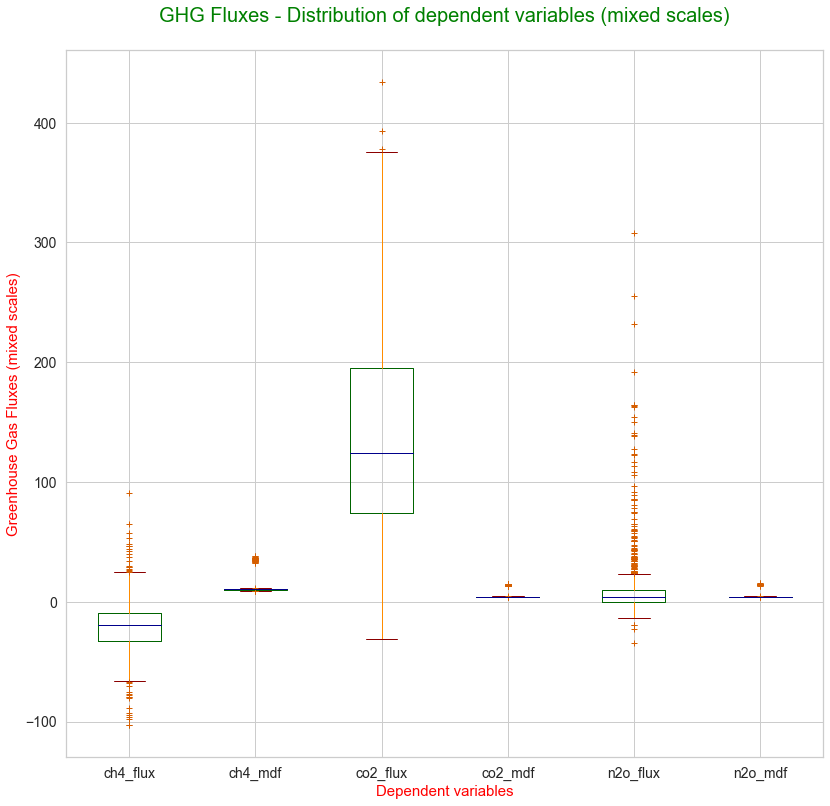

<AxesSubplot:title={'center':'GHG Fluxes - Distribution of dependent variables (mixed scales)\n'}, xlabel='Dependent variables', ylabel='Greenhouse Gas Fluxes (mixed scales)'>

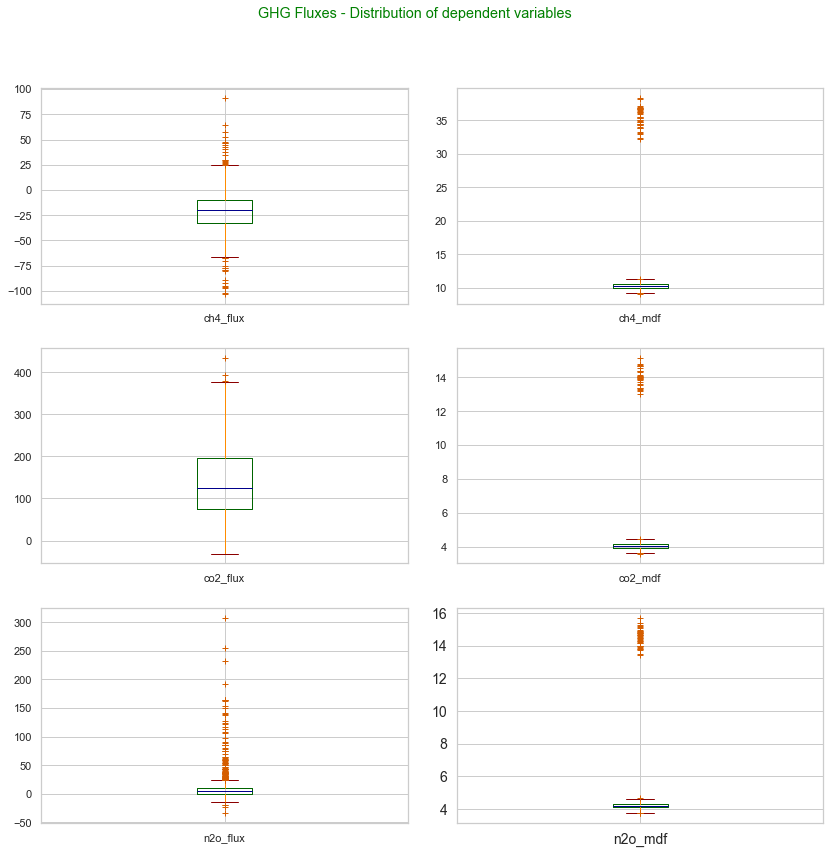

ch4_flux     AxesSubplot(0.067419,0.656532;0.423973x0.249211)
ch4_mdf      AxesSubplot(0.548249,0.656532;0.423973x0.249211)
co2_flux     AxesSubplot(0.067419,0.355836;0.423973x0.249211)
co2_mdf      AxesSubplot(0.548249,0.355836;0.423973x0.249211)
n2o_flux    AxesSubplot(0.067419,0.0551396;0.423973x0.249211)
n2o_mdf     AxesSubplot(0.548249,0.0551396;0.423973x0.249211)
dtype: object

In [12]:
def box_plot(
    dataframe,
    plot_name,
    title=None,
    xlabel=None,
    ylabel=None,
    subplots=False,
    suptitle=None,
):
    """Draw box plot of data types distribution.

    Args:
        dataframe (object): dataframe analysed.
        plot_name (str): name of the plot.
        title (str, optional): main title. Defaults to None.
        xlabel (str, optional): name of the x-axis label. Defaults to None.
        ylabel (str, optional): name of the y-axis label. Defaults to None.
        subplots (bool, optional): choice of drawing subplots. Set to "True"
            to draw subplots. Defaults to False.
        suptitle (str, optional): suptitle name. Defaults to None.

    Returns:
        object: boxplot figure.
    """
    color = {
        "boxes": "DarkGreen",
        "whiskers": "DarkOrange",
        "medians": "DarkBlue",
        "caps": "DarkRed",
    }
    box_plot = dataframe.plot(
        kind="box",
        color=color,
        sym="r+",  # shape of value symbol "+"
        subplots=subplots,  # activate the use of subplots (i.e. multipanes)
        layout=(3, 2),  # configuration of the subplots (rows * columns)
        sharex=False,
        sharey=False,
        figsize=(12, 12),
    )
    plt.xlabel(
        xlabel=xlabel,
        fontdict={"fontsize": 15, "fontweight": 3, "color": "Red"},
    )

    plt.xticks(rotation=0, horizontalalignment="center", fontsize=14)
    plt.ylabel(
        ylabel=ylabel,
        fontdict={"fontsize": 15, "fontweight": 3, "color": "Red"},
    )
    plt.yticks(rotation=0, horizontalalignment="right", fontsize=14)
    plt.title(
        title,
        y=1,
        fontdict={"fontsize": 20, "fontweight": 5, "color": "green"},
    )
    # use "suptitle()" when the "subplots" parameter is activated (i.e. "True")
    plt.suptitle(
        suptitle,
        y=1,
        fontdict={"fontsize": 20, "fontweight": 5, "color": "green"},
    )
    plt.tight_layout(pad=2)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return box_plot


box_plot(
    ghg_flux_data,
    title=f"GHG Fluxes - "
    f"Distribution of dependent variables (mixed scales)\n",
    plot_name="ghg_flux_data_dependent_variables_box",
    xlabel="Dependent variables",
    ylabel="Greenhouse Gas Fluxes (mixed scales)",
    subplots=False,
)
box_plot(
    ghg_flux_data,
    suptitle=f"GHG Fluxes - Distribution of dependent variables\n",
    plot_name="ghg_flux_data_dependent_variables_box_subplots",
    # xlabel="Dependent variables",
    # ylabel="Greenhouse Gas Fluxes",
    subplots=True,
)



In [13]:
def duplicate_data(dataframe):
    """Check for duplicated rows.

    Args:
        dataframe (object): dataframe without duplicates.
    """
    if len(dataframe[dataframe.duplicated(keep=False)]) > 0:
        dataframe.drop_duplicates(keep="first", inplace=True)
        print("\nWarning! Duplicated values have been detected!\n")
    else:
        print("\nNo duplicates found.\n")
    return dataframe


duplicate_data(ghg_flux_data)




No duplicates found.



,SampleTrackerNo,Year,Month,Season,Operator,co2_treatment,Ring,Block,Collar_Unique_ID,ch4_flux,ch4_mdf,co2_flux,co2_mdf,n2o_flux,n2o_mdf,Sampling_Date_tz
Sampling_Date,,,,,,,,,,,,,,,,
2013-06-05,2652,2013,May,Autumn,Loic,Elevated,1,1,1.0,-21.653,10.506,73.752,4.154,-5.688,4.306,2013-06-05 00:00:00+10:00
2013-06-05,2653,2013,May,Autumn,Loic,Elevated,1,1,1.1,-16.542,10.176,53.102,4.024,7.282,4.171,2013-06-05 00:00:00+10:00
2013-06-05,2654,2013,May,Autumn,Loic,Elevated,1,1,1.2,-29.811,9.841,77.927,3.891,-2.489,4.034,2013-06-05 00:00:00+10:00
2013-06-05,2655,2013,May,Autumn,Loic,Elevated,1,1,1.4,-13.522,10.474,71.857,4.141,1.092,4.293,2013-06-05 00:00:00+10:00
2013-06-05,2656,2013,May,Autumn,Loic,Elevated,1,1,1.5,-27.293,10.518,124.668,4.159,6.601,4.312,2013-06-05 00:00:00+10:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-06-15,16094,2016,Jun,Autumn,Loic,Ambient,6,3,6.3,-9.953,10.097,96.989,3.992,8.893,4.139,2016-06-15 00:00:00+10:00
2016-06-15,16095,2016,Jun,Autumn,Loic,Ambient,6,3,6.4,-16.797,10.713,95.077,4.236,-3.153,4.391,2016-06-15 00:00:00+10:00
2016-06-15,16096,2016,Jun,Autumn,Loic,Ambient,6,3,6.5,-12.044,10.908,82.022,4.313,2.617,4.471,2016-06-15 00:00:00+10:00


In [14]:
def nan_values_detection(dataframe):
    """Detect the extent of missing values (or NaN values).

    Args:
        dataframe (object): main dataframe.

    Returns:
        object: dataframe representing the NaN table of missing values.
    """
    # check if any items in a row are not-zero, not-empty or not-False
    print(f"\nVariables with missing data: \n{dataframe.isna().any()}\n")

    # table of % of missing values using the "sidetable" library instead
    # of performing the task manually
    nan_table = dataframe.stb.missing(
        clip_0=True,
        # style=True  # not working?
    )
    print(f"\nSummary of missing data: \n{nan_table}\n")

    # calculate the percentage of NaNs in the dependent variables
    total_nan_values = dep_vars.isna().sum().sum()
    total_dep_vars_values = dep_vars.count().sum()
    pct_nan_dep_vars = total_nan_values / total_dep_vars_values
    print(
        f"\nTotal number of NaN values in the dependent variables: "
        f"{total_nan_values}\n"
        f"Total percentage of NaN values: {pct_nan_dep_vars:.1%}\n"
    )
    # # below NOT working
    # # gives the list of indexes corresponding to missing vallues (NaNs)
    # nan_values_index = (
    #     dataframe[["ch4_flux", "co2_flux", "n2o_flux"]]
    #     .isna()
    #     .to_numpy()
    #     .nonzero()
    # )
    # # nan_list = nan_values_index.index.to_list()
    # print(f"\nList of NaN values: \n{nan_values_index}\n")
    return nan_table


nan_table = nan_values_detection(ghg_flux_data)




Variables with missing data: 
SampleTrackerNo      True
Year                False
Month               False
Season              False
Operator             True
co2_treatment       False
Ring                False
Block               False
Collar_Unique_ID    False
ch4_flux             True
ch4_mdf              True
co2_flux             True
co2_mdf              True
n2o_flux             True
n2o_mdf              True
Sampling_Date_tz    False
dtype: bool


Summary of missing data: 
                 missing  total  percent
n2o_flux             173   1596   10.840
ch4_flux             132   1596    8.271
n2o_mdf              127   1596    7.957
co2_flux             114   1596    7.143
ch4_mdf               99   1596    6.203
co2_mdf               99   1596    6.203
Operator              56   1596    3.509
SampleTrackerNo       42   1596    2.632


Total number of NaN values in the dependent variables: 744
Total percentage of NaN values: 8.4%



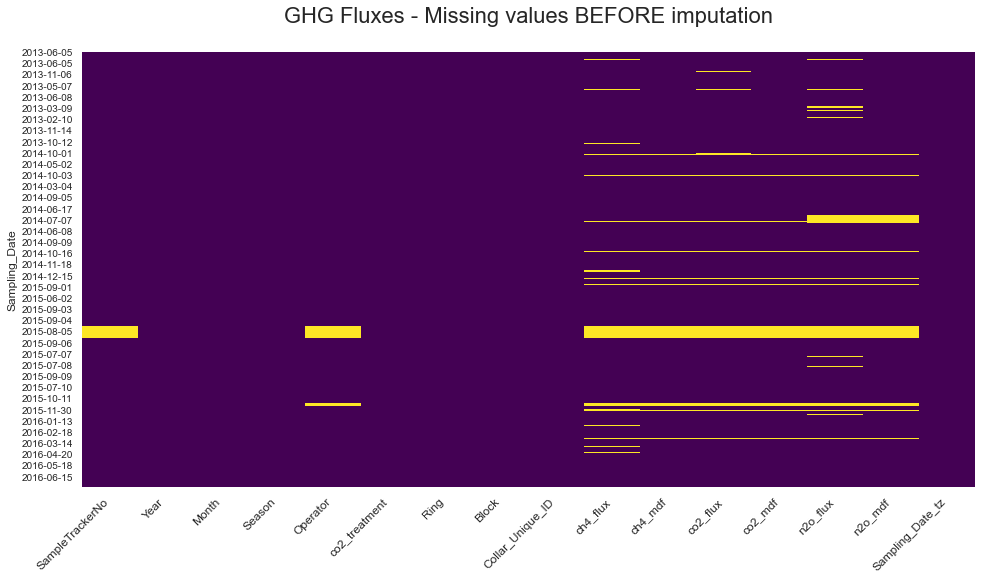

In [15]:
def missing_values_matrix_plot(dataframe, title, plot_name):
    """Display all missing values BEFORE the imputation steps.

    Here, use the "seaborn (sns)" library to draw a matrix plot.

    Args:
        dataframe (object): dataframe to analyse.
        title (str): name of the title.
        plot_name (str): name of the plot.

    Returns:
        object: matrix plot.
    """
    title = title
    plot_name = plot_name

    plt.figure(figsize=(16, 8))
    heatmap = sns.heatmap(dataframe.isna(), cbar=False, cmap="viridis",)
    heatmap.set_xticklabels(
        heatmap.get_xticklabels(),
        rotation=45,
        horizontalalignment="right",
        fontsize=12,
    )
    heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=10)
    plt.title(title, fontsize=22)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return heatmap


missing_values_heatmap = missing_values_matrix_plot(
    ghg_flux_data,
    title="GHG Fluxes - Missing values BEFORE imputation\n",
    plot_name="ghg_flux_data_missing_data_raw_heatmap",
)



In [16]:
def columns_w_many_nans(dataframe, missing_percent_threshold=0.6):
    """Remove COLUMNS with a very high amount of missing values (default=0.6).

    Drop some columns as it could bias the statistical analyses.

    Args:
        dataframe (object): dataframe analysed.
        missing_percent_threshold (float, optional): percentage threshold for
            detecting nan values within a column. Defaults to 0.6.

    Returns:
        object: dataframe with deleted columns due to hign nans % value ?
    """
    missing_percent_threshold = missing_percent_threshold
    mask_percent = dataframe.isna().mean()
    series = mask_percent[mask_percent > missing_percent_threshold]
    nan_columns = series.index.to_list()
    print(
        f"\nColumns with more than {missing_percent_threshold:.0%} of NaNs: "
        f"\n{nan_columns}\n"
    )
    dataframe.drop(nan_columns, axis=1, inplace=True)
    print(f"\nThe following 'NaN' columns were removed: \n{nan_columns}\n")
    all_removed_variables_list = [*nan_columns]
    print(f"\nList of all removed variables: \n{all_removed_variables_list}\n")
    return


columns_w_many_nans(ghg_flux_data, missing_percent_threshold=0.8)




Columns with more than 80% of NaNs: 
[]


The following 'NaN' columns were removed: 
[]


List of all removed variables: 
[]



In [17]:
def omit_rows_w_missing_values(dataframe, query):
    """Select rows to be skipped during the imputation steps.

    Before filling NA values, remove the following rows/dates from the df:
        - dates with no sampling at all on "2015-05-08"
        - N2O fluxes for ring 6 on "2014-07-07"
        - dates with missing all data for rings 5 and 6 on "2015-10-11"
        - CO2 fluxes for ring 6 on "2014-10-01"
    These will be imputed later during statistical analysis.

    Use the .query() method to locate these missing values and save them in a
    temporary dataframe called "dataframe_no_cleaning".

    Args:
        dataframe (object): dataframe being analysed.
        query (str): list of queries to run through for removing sample rows
            from the dataframe.

    Returns:
        object: dataframe with rows removed.
    """
    dataframe = dataframe.query(query)
    print(f"\nNumber of missing values not cleaned: {len(dataframe)}\n")
    print(
        f"\nPreview of missing values with no cleaning applied: \n"
        f"\n{dataframe.sample(10)}\n",
    )
    return dataframe


ghg_flux_no_cleaning = omit_rows_w_missing_values(
    ghg_flux_data,
    query="Sampling_Date == '2015-10-11' and Ring == (5,6) or "
    "Sampling_Date == '2015-08-05' or "
    "Sampling_Date == '2014-07-07' or "
    "Sampling_Date == '2014-10-01' and Ring == 6",
)




Number of missing values not cleaned: 105


Preview of missing values with no cleaning applied: 

              SampleTrackerNo  Year Month  Season Operator co2_treatment Ring  \
Sampling_Date                                                                   
2015-08-05                NaN  2015   May  Autumn      NaN       Ambient    2   
2015-08-05                NaN  2015   May  Autumn      NaN       Ambient    2   
2015-10-11              12688  2015   Nov  Spring      NaN      Elevated    5   
2015-08-05                NaN  2015   May  Autumn      NaN      Elevated    1   
2014-07-07               8193  2014   Jul  Winter      Yui      Elevated    5   
2015-08-05                NaN  2015   May  Autumn      NaN       Ambient    3   
2014-07-07               8205  2014   Jul  Winter      Yui       Ambient    6   
2014-07-07               8188  2014   Jul  Winter  Jasmine      Elevated    4   
2014-07-07               8175  2014   Jul  Winter    Chris       Ambient    2   
2014-07-07


Number of rows without the 'dataframe_no_cleaning' dataframe: 
1491


Initial number of missing values: 103


Number of missing values after NA filling procedure: 0

List of missing values after NA filling procedure: 

Empty DataFrame
Columns: [SampleTrackerNo, Year, Month, Season, Operator, co2_treatment, Ring, Block, Collar_Unique_ID, ch4_flux, ch4_mdf, co2_flux, co2_mdf, n2o_flux, n2o_mdf, Sampling_Date_tz]
Index: []


Number of rows following the NA filling procedure and with back-concatenation of the 'dataframe_no_cleaning' dataframe: 
1596



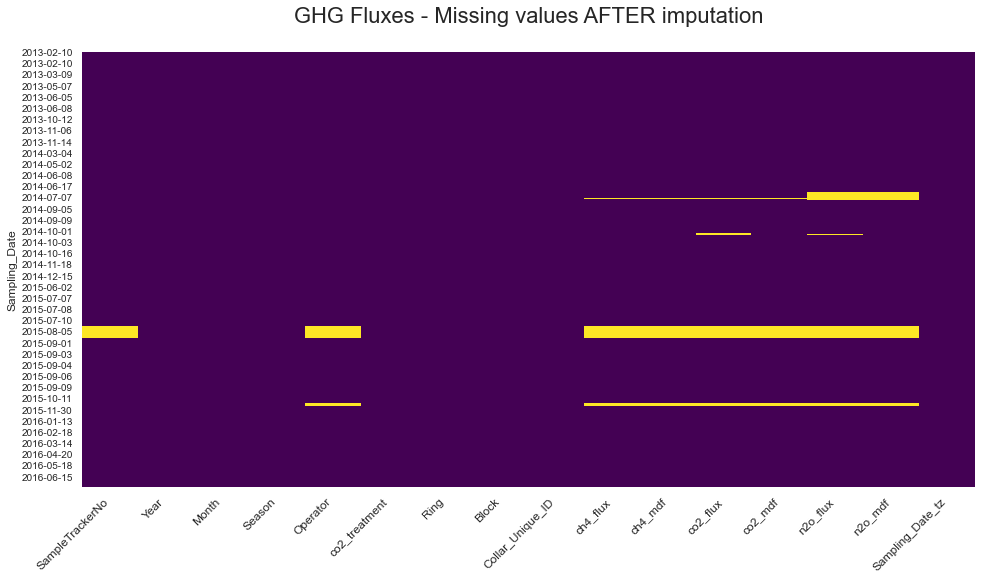

<AxesSubplot:title={'center':'GHG Fluxes - Missing values AFTER imputation\n'}, ylabel='Sampling_Date'>


Final dataframe info: 

<class 'pandas.core.frame.DataFrame'>
Index: 1596 entries, 2013-02-10 to 2016-06-15
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype                           
---  ------            --------------  -----                           
 0   SampleTrackerNo   1554 non-null   category                        
 1   Year              1596 non-null   category                        
 2   Month             1596 non-null   category                        
 3   Season            1596 non-null   category                        
 4   Operator          1540 non-null   category                        
 5   co2_treatment     1596 non-null   category                        
 6   Ring              1596 non-null   category                        
 7   Block             1596 non-null   category                        
 8   Collar_Unique_ID  1596 non-null   category                        
 9   ch4_flux          1536 non-null   float64                    

In [18]:
def nan_values_imputation(dataframe, group_factors):
    """Fill/replace the missing values not identified in the previous step.

    Do a left merge to keep only the rows that do NOT appear in
    "dataframe_no_cleaning" while keeping the same index values.
    Using the "_merge" keyword allows the identification and keep the
    left-merged values (" == "left_only"), thanks to the attribute
    "indicator=True" above.

    Replace "NaN" cells of "CH4, CO2 and N2O fluxes and mdf" with the means
    for each ring and assign these mean values to the corresponding
    missing value. Alternatively, the median value could be favoured.
    Use "Sampling_Date" and "Ring" as grouping factor as we only want to
    fill up the nan values that correspond to local pseudo-replicates.

    Concatenate the dataframes "ghg_flux_data_clean" and
    "dataframe_no_cleaning" back together and sort by "Sampling_Date"
    but NOT by "SampleTrackerNo" as it contains NaNs because of
    one day/month when sampling did not occur.

    Args:
        dataframe (object): dataframe with dummified categorical variables.
        group_factors (str): this is the variables selected to define the
            group that will be averaged to fill up the NaNs.

    Returns:
        object: dataframe with "cleaned" data, i.e. with the gap-filling step.
    """
    dataframe = (
        dataframe.reset_index()
        .merge(ghg_flux_no_cleaning, how="left", indicator=True)
        .set_index("Sampling_Date")
    )
    dataframe = dataframe[dataframe["_merge"] == "left_only"]
    dataframe = dataframe.drop("_merge", axis=1)
    print(
        f"\nNumber of rows without the 'dataframe_no_cleaning' dataframe: "
        f"\n{len(dataframe)}\n"
    )
    total_missing = dataframe[dataframe.isna().any(axis=1)]
    print(f"\nInitial number of missing values: {len(total_missing)}\n")

    # imputation step (refactor with list comprehension)
    for value in dep_vars:
        dataframe[value] = dataframe[value].fillna(
            dataframe.groupby(group_factors)[value].transform("mean")
        )

    missing_after_clean = dataframe[dataframe.isna().any(axis=1)]
    print(
        f"\nNumber of missing values after NA filling procedure: "
        f"{len(missing_after_clean)}\n"
        f"\nList of missing values after NA filling procedure: \n"
        f"\n{missing_after_clean.sample(len(missing_after_clean))}\n"
    )

    concat_list = [dataframe, ghg_flux_no_cleaning]
    dataframe_concat = pd.concat(concat_list, axis=0)
    dataframe_concat.sort_values(
        by=["Sampling_Date", "Ring", "Collar_Unique_ID"], inplace=True
    )
    # check that the dataset has the expected number of rows (1596)
    print(
        f"\nNumber of rows following the NA filling procedure and with "
        f"back-concatenation of the 'dataframe_no_cleaning' dataframe: "
        f"\n{len(dataframe_concat)}\n"
    )
    return dataframe_concat


ghg_flux_data_clean = nan_values_imputation(
    ghg_flux_data, group_factors=["Sampling_Date", "Ring"],
)

# print a new matrix plot following data imputation/cleaning process
missing_values_matrix_plot(
    ghg_flux_data_clean,
    title="GHG Fluxes - Missing values AFTER imputation\n",
    plot_name="ghg_flux_data_missing_data_clean_heatmap",
)
print(f"\nFinal dataframe info: \n")
print(f"\n{ghg_flux_data_clean.info()}\n")
print(f"\nFinal dataframe preview: \n" f"\n{ghg_flux_data_clean.sample(10)}\n")



In [19]:
def save_backup_file(dataframe, file_name):
    """Create a back-up of the newly generated files,both .csv & .pickle files.

    For pickling, protocol value ranges from 0 to 5 (the higher, the better).

    This is applied when a new .csv file is created in
    the "./save" folder and will be used as a source by another function.
    Hence, a copy of the new file is made and named with the "_backup" suffix
    and the initial file is then copied to the ".sources" folder.
    """
    csv = dataframe.to_csv(
        file_path_save + file_name + ".csv",
        sep=",",
        encoding="utf-8",
        na_rep="nan",
        header=True,
        index=True,
    )
    pickle = dataframe.to_pickle(
        file_path_save + file_name + ".pkl", compression="infer", protocol=5
    )
    save_file_format = [".pkl", ".csv"]  # must be in this order,or not working
    for file_format in save_file_format:
        # create a back-up copy that goes to the backup folder (./backup)
        original = file_path_save + file_name + file_format
        target_0 = file_path_backup + file_name + "_backup" + file_format
        shutil.copyfile(original, target_0)
        # create another copy to save in the source folder (./sources) as
        # it will become a source file for the exploratory data analysis (EDA)
        target_1 = file_path_source + file_name + file_format
        shutil.copyfile(original, target_1)
        print(f"\nFiles saved and backed-up!\n")
        return csv, pickle


save_backup_file(ghg_flux_data_clean, file_name="ghg_flux_data_cleaned")



Files saved and backed-up!



(None, None)